<a href="https://colab.research.google.com/github/vvozzy/Image-Colorization-U-Net-Noob-Solution/blob/main/ImageColorization_UNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Colorization: U-Net Noob Solution 🖍️ 



# Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# from tqdm.notebook import tqdm

import pathlib
import pickle
from keras.preprocessing.image import load_img, img_to_array

from skimage.color import rgb2lab, lab2rgb

In [ ]:
from google.colab import files, drive

In [ ]:
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# PyTorch import

In [ ]:
# !pip3 install torch==1.2.0+cu92 torchvision==0.4.0+cu92 -f https://download.pytorch.org/whl/torch_stable.html

In [ ]:
import torch

import torch.nn as nn
import torch.nn.functional as F

import torchvision

from torchvision.transforms import transforms
from torch.utils.data import Dataset, DataLoader

In [ ]:
#upload model checkpoint file if needed
files.upload()

In [ ]:
state_dict = torch.load('checkpoint_UNET_Dogs-vs-Cats.pth')
print(state_dict.keys())

odict_keys(['conv1.0.weight', 'conv1.0.bias', 'conv1.1.weight', 'conv1.1.bias', 'conv1.1.running_mean', 'conv1.1.running_var', 'conv1.1.num_batches_tracked', 'conv1.3.weight', 'conv1.3.bias', 'conv1.4.weight', 'conv1.4.bias', 'conv1.4.running_mean', 'conv1.4.running_var', 'conv1.4.num_batches_tracked', 'conv2.0.weight', 'conv2.0.bias', 'conv2.1.weight', 'conv2.1.bias', 'conv2.1.running_mean', 'conv2.1.running_var', 'conv2.1.num_batches_tracked', 'conv2.3.weight', 'conv2.3.bias', 'conv2.4.weight', 'conv2.4.bias', 'conv2.4.running_mean', 'conv2.4.running_var', 'conv2.4.num_batches_tracked', 'conv3.0.weight', 'conv3.0.bias', 'conv3.1.weight', 'conv3.1.bias', 'conv3.1.running_mean', 'conv3.1.running_var', 'conv3.1.num_batches_tracked', 'conv3.3.weight', 'conv3.3.bias', 'conv3.4.weight', 'conv3.4.bias', 'conv3.4.running_mean', 'conv3.4.running_var', 'conv3.4.num_batches_tracked', 'conv4.0.weight', 'conv4.0.bias', 'conv4.1.weight', 'conv4.1.bias', 'conv4.1.running_mean', 'conv4.1.running_var

In [ ]:
#or import checkpoint file from your Google Drive 
state_dict = torch.load('/content/drive/My Drive/Project_Image_Colorization/dataset/checkpoint_UNET_Dogs-vs-Cats_2_1.pth')
print(state_dict.keys())

odict_keys(['conv1.0.weight', 'conv1.0.bias', 'conv1.1.weight', 'conv1.1.bias', 'conv1.1.running_mean', 'conv1.1.running_var', 'conv1.1.num_batches_tracked', 'conv1.3.weight', 'conv1.3.bias', 'conv1.4.weight', 'conv1.4.bias', 'conv1.4.running_mean', 'conv1.4.running_var', 'conv1.4.num_batches_tracked', 'conv2.0.weight', 'conv2.0.bias', 'conv2.1.weight', 'conv2.1.bias', 'conv2.1.running_mean', 'conv2.1.running_var', 'conv2.1.num_batches_tracked', 'conv2.3.weight', 'conv2.3.bias', 'conv2.4.weight', 'conv2.4.bias', 'conv2.4.running_mean', 'conv2.4.running_var', 'conv2.4.num_batches_tracked', 'conv3.0.weight', 'conv3.0.bias', 'conv3.1.weight', 'conv3.1.bias', 'conv3.1.running_mean', 'conv3.1.running_var', 'conv3.1.num_batches_tracked', 'conv3.3.weight', 'conv3.3.bias', 'conv3.4.weight', 'conv3.4.bias', 'conv3.4.running_mean', 'conv3.4.running_var', 'conv3.4.num_batches_tracked', 'conv4.0.weight', 'conv4.0.bias', 'conv4.1.weight', 'conv4.1.bias', 'conv4.1.running_mean', 'conv4.1.running_var

In [ ]:
model_2.load_state_dict(state_dict)

<All keys matched successfully>

#Utils

In [ ]:
#better don't use the function cause it uses all your RAM

# def img_fold_to_dataset_list(dir, target_size=(32, 32)):
#     dataset_list = []

#     for i, img in enumerate(pathlib.Path(dir).iterdir()):
#         current_img = load_img(img, target_size) #target_size=(32, 32) ok for RAM #200-200, 100-100
#         array_img = img_to_array(current_img, dtype=np.uint8)
#         dataset_list.append(array_img)
#         print(f'{i} img done')

#     return dataset_list

##Metrics to use

In [ ]:
#just for fun
def eucldn_distance(ground_truth, preds):
    sum_array = np.sum((ground_truth - preds) ** 2)
    eucldn_distance = np.sqrt(sum_array)
    return eucldn_distance

In [ ]:
#adopted from Zelda framework (Michael Konstantinov)

#exponential moving average
def exponential_smoothing(series, alpha=0.6):
    exp_smooth_list = [series[0]]

    for t in range(1, len(series) - 1):
        smooth_value = alpha * exp_smooth_list[-1] + (1 - alpha) * series[t]
        exp_smooth_list.append(smooth_value)
    return exp_smooth_list


def plot_loss(loss_list, alpha=0.6):
    plt.plot(loss_list)
    plt.plot(exponential_smoothing(loss_list, alpha))
    # plt.title('loss')
    plt.xlabel('batch')
    plt.ylabel('loss')
    plt.show()

##Model Summary

*PyTorch Summary* https://github.com/pytorch/pytorch/issues/2001#issuecomment-405675488

In [ ]:
#model summary for PyTorch
import sys
from functools import reduce
from torch.nn.modules.module import _addindent

def summary(model, file=sys.stderr):
    def repr(model):
        # We treat the extra repr like the sub-module, one item per line
        extra_lines = []
        extra_repr = model.extra_repr()
        # empty string will be split into list ['']
        if extra_repr:
            extra_lines = extra_repr.split('\n')
        child_lines = []
        total_params = 0
        for key, module in model._modules.items():
            mod_str, num_params = repr(module)
            mod_str = _addindent(mod_str, 2)
            child_lines.append('(' + key + '): ' + mod_str)
            total_params += num_params
        lines = extra_lines + child_lines

        for name, p in model._parameters.items():
            total_params += reduce(lambda x, y: x * y, p.shape)

        main_str = model._get_name() + '('
        if lines:
            # simple one-liner info, which most builtin Modules will use
            if len(extra_lines) == 1 and not child_lines:
                main_str += extra_lines[0]
            else:
                main_str += '\n  ' + '\n  '.join(lines) + '\n'

        main_str += ')'
        if file is sys.stderr:
            main_str += ', \033[92m{:,}\033[0m params'.format(total_params)
        else:
            main_str += ', {:,} params'.format(total_params)
        return main_str, total_params

    string, count = repr(model)
    if file is not None:
        print(string, file=file)
    return count

##Visualization

In [ ]:
def dataset_visualization(dataset, dim1, dim2, figure_size=(16,16)):

    plt.figure(figsize=figure_size)
    
    for i in range(dim1 * dim2):
        plt.subplot(dim1, dim2, i + 1)
        plt.imshow(dataset[i])
        plt.axis("off")

    plt.show()

In [ ]:
# lab_dim = o (gray-scale), lab_dim = 1 (green-red), lab_dim = 2 (blue-yellow)

def single_dim_extraction_from_LAB(image, lab_dim=0, brightness = 75):

    z = np.zeros(image.shape)
    
    if lab_dim != 0:
        z [: , : , 0] = brightness # brightness is needed to plot the image along 1st or 2nd axis
        
    z [:, :, lab_dim] = image[:, :, lab_dim]
    z = lab2rgb(z)

    return(z)   

In [ ]:
def LAB_image_visualization(image, figure_size=(16,16)):

    titles = ["L: gray-scale", "A: green-red", "B: blue-yellow"]

    plt.figure(figsize=figure_size)

    for d in range(3):
        single_dim = single_dim_extraction_from_LAB(image, d) 
        plt.subplot(1, 3, d + 1)
        plt.axis("off")
        plt.imshow(single_dim)
        plt.title(titles[d])

    plt.show()

In [ ]:
def RGB_image_visualization(image, figure_size=(16,16)):

    titles = ["R", "G", "B"]

    plt.figure(figsize=figure_size)

    for d in range(3):
        single_dim = np.zeros(image.shape)
        single_dim[:,:,d] = image[:,:,0]
        single_dim = single_dim / 255.0
        plt.subplot(1, 3, d + 1)
        plt.axis("off")
        plt.imshow(single_dim)
        plt.title(titles[d])

    plt.show()

#Dataset Dowloading&Preprocessing

 Datasets:

*CIFAR-100*

*Dogs vs Cats*
https://www.kaggle.com/c/dogs-vs-cats/data


##Datasets

###CIFAR-100

In [ ]:
from keras.datasets import cifar100

(x_train, y_train), (x_test, y_test) = cifar100.load_data()

In [ ]:
np.shape(x_test)

(10000, 32, 32, 3)

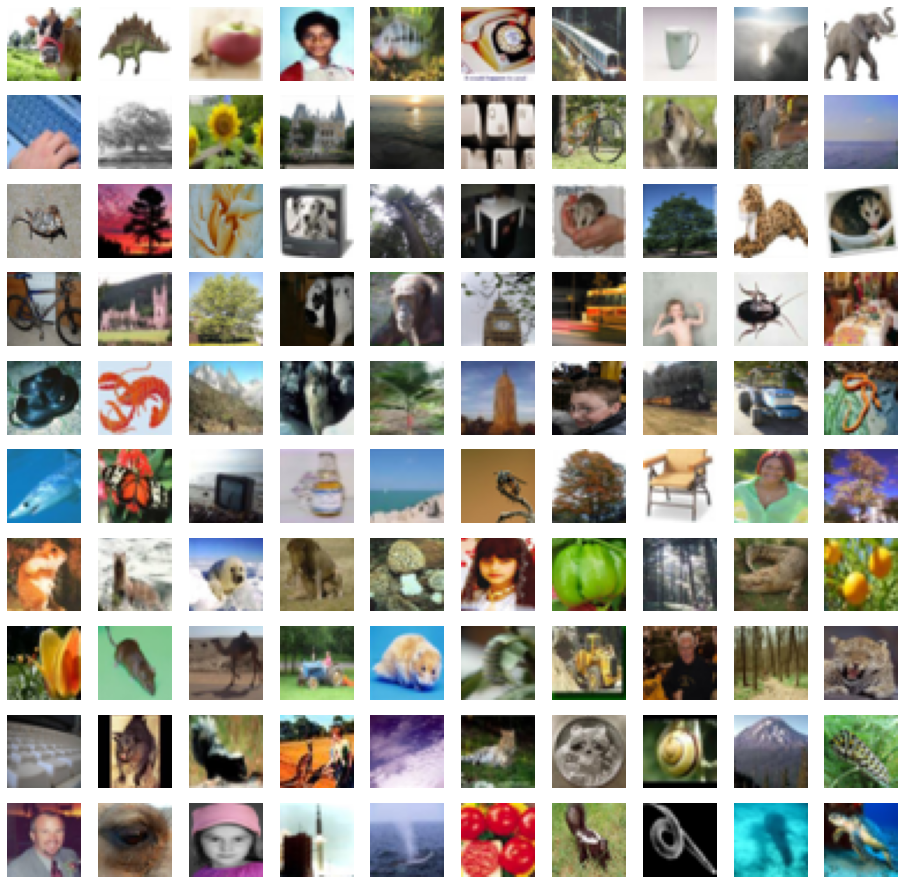

In [ ]:
dataset_visualization(x_train, 10, 10)

###Dogs-vs-Cats

####Downloading to GoogleDrive

In [ ]:
#upload your kaggle API token (kaggle.json)
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle.json': b'{"username":"veronikavozniuk","key":"c2cab8130eb117d79cc0a9b609307e63"}'}

In [ ]:
!pip install -q kaggle

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle 
!chmod 600 /root/.kaggle/kaggle.json

kaggle.json


In [ ]:
#dogs-vs-cats
#dogs-vs-cats-redux-kernels-edition

!kaggle competitions download -c dogs-vs-cats-redux-kernels-edition

  0% 0.00/111k [00:00<?, ?B/s]
100% 111k/111k [00:00<00:00, 39.6MB/s]
 95% 257M/271M [00:02<00:00, 128MB/s]
100% 271M/271M [00:02<00:00, 108MB/s]
 97% 529M/544M [00:06<00:00, 32.5MB/s]
100% 544M/544M [00:06<00:00, 82.9MB/s]


In [ ]:
! unzip train.zip -d '/content/drive/My Drive/Project_Image_Colorization/dataset'

Показано результат, скорочений до останніх рядків (5000).
  inflating: /content/drive/My Drive/Project/dataset/train/dog.55.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.550.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5500.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5501.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5502.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5503.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5504.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5505.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5506.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5507.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5508.jpg  
  inflating: /content/drive/My Drive/Project/dataset/train/dog.5509.jpg  
  inflating: /content/drive/My Drive/Project/dataset/trai

In [ ]:
! unzip test.zip -d '/content/drive/My Drive/Project_Image_Colorization/dataset'

Показано результат, скорочений до останніх рядків (5000).
  inflating: /content/drive/My Drive/Project/dataset/test/55.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/550.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5500.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5501.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5502.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5503.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5504.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5505.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5506.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5507.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5508.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/5509.jpg  
  inflating: /content/drive/My Drive/Project/dataset/test/551.jpg  
  inflating: /content/drive/My Drive/Project/data

####Converting imgs->arrays

In [ ]:
train_dir = '/content/drive/My Drive/Project_Image_Colorization/dataset/train'
test_dir = '/content/drive/My Drive/Project_Image_Colorization/dataset/test'

#####Converting train

In [ ]:
# train_dataset = img_fold_to_dataset_list(train_dir, target_size=(32, 32)) #def takes much more RAM than just a code

In [ ]:
train_dataset = []

In [ ]:
for img in pathlib.Path(train_dir).iterdir():
    current_img = load_img(img, color_mode='rgb', target_size=(80, 80))
    array_img = img_to_array(current_img, dtype=np.uint8)
    train_dataset.append(array_img)
    print(f'{img} done')

Показано результат, скорочений до останніх рядків (5000).
/content/drive/My Drive/Project/dataset/train/dog.2382.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2366.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2348.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2363.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2336.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2362.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2364.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2359.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2372.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2379.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2358.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2388.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2350.jpg done
/content/drive/My Drive/Project/dataset/train/dog.2391.jpg done
/content/drive/My Drive/Project/dataset/train/

In [ ]:
#save train dataset
with open('/content/drive/My Drive/Project/dataset/train.pickle', 'wb') as f:
  pickle.dump(train_dataset, f)

#####Converting test

In [ ]:
# test_dataset = img_fold_to_dataset_list(test_dir, target_size=(64, 64))

In [ ]:
test_dataset = []

In [ ]:
for img in pathlib.Path(test_dir).iterdir():
    current_img = load_img(img, color_mode='rgb', target_size=(80, 80))
    array_img = img_to_array(current_img, dtype=np.uint8)
    test_dataset.append(array_img)
    print("done")

Показано результат, скорочений до останніх рядків (5000).
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
done
do

In [ ]:
#save test dataset
with open('/content/drive/My Drive/Project/dataset/test.pickle', 'wb') as f:
  pickle.dump(test_dataset, f)

####Uploading to Colab

In [ ]:
#uploading train
with open('/content/drive/My Drive/Project_Image_Colorization/dataset/train.pickle', 'rb') as f:
  x_train = pickle.load(f)

In [ ]:
#uploading test
with open('/content/drive/My Drive/Project_Image_Colorization/dataset/test.pickle', 'rb') as f:
  x_test = pickle.load(f)

In [ ]:
x_train = np.asarray(x_train)
x_test = np.asarray(x_test)

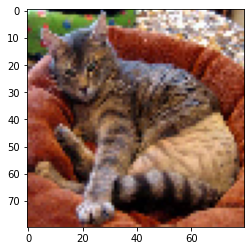

In [ ]:
plt.imshow(x_train[0])
# plt.axis("off")
plt.show()

In [ ]:
np.shape(x_train)

(24999, 80, 80, 3)

##RGB to LAB space

REFS:

*rgb-lab-rgb & LAB visuzalization*
https://fairyonice.github.io/Color-space-defenitions-in-python-RGB-and-LAB.html

*Whole model, but also rgb to lab explained*
https://blog.floydhub.com/colorizing-b-w-photos-with-neural-networks/

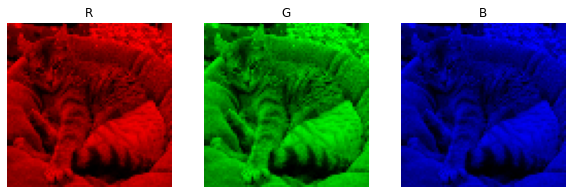

In [ ]:
RGB_image_visualization(x_train[0], figure_size=(10,10))

In [ ]:
# normalization of RGB
x_train_rgb = x_train / 255.0
x_test_rgb = x_test / 255.0

In [ ]:
# RGB to LAB
x_train_lab = rgb2lab(x_train_rgb)
x_test_lab = rgb2lab(x_test_rgb)

In [ ]:
# LAB to RGB for cheking

x_train_back_rgb = np.zeros(x_train_lab.shape)

for i in range(x_train_lab.shape[0]):
    x_train_back_rgb[i] = lab2rgb(x_train_lab[i])

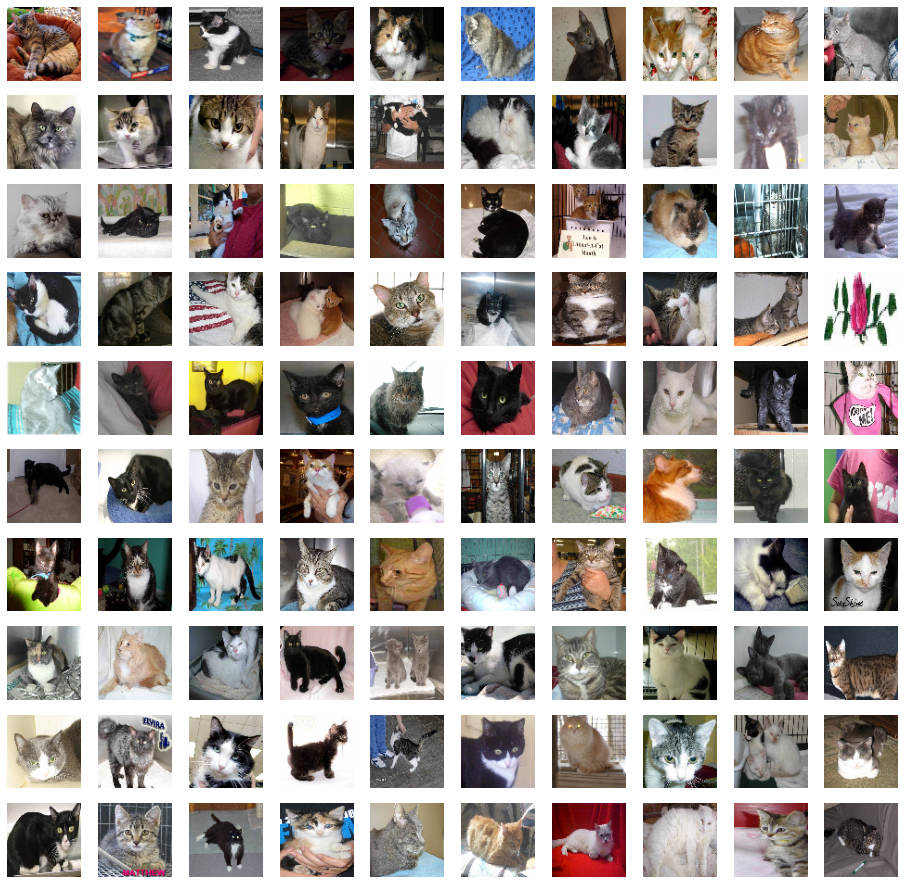

In [ ]:
dataset_visualization(x_train_back_rgb, 10, 10)

In [ ]:
np.shape(x_train_lab)

(24999, 80, 80, 3)

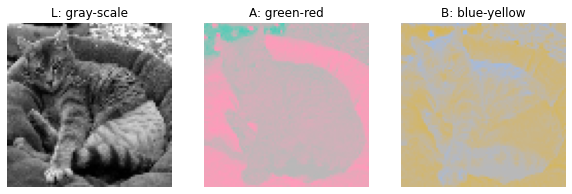

In [ ]:
LAB_image_visualization(x_train_lab[0], figure_size=(10,10))

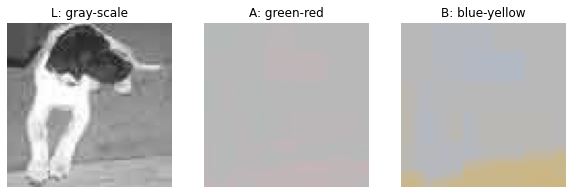

In [ ]:
LAB_image_visualization(x_test_lab[0], figure_size=(10,10))

##Preparing ***y_test_lab*** and ***y_train_lab***

In [ ]:
# normalization of LAB from (-128, 128) to (-1, 1)
x_train_lab = x_train_lab / 128.0
x_test_lab = x_test_lab / 128.0

In [ ]:
y_train_lab = x_train_lab[:, :, :, 1:]
y_test_lab = x_test_lab[:, :, :, 1:]

x_train_lab = x_train_lab[:, :, :, :1]
x_test_lab = x_test_lab[:, :, :, :1]

##Transformation to PyTorch Dataset

REFS

*Custom Pytorch Dataset MNIST* https://debuggercafe.com/custom-dataset-and-dataloader-in-pytorch/

https://towardsdatascience.com/pytorch-tabular-binary-classification-a0368da5bb89

In [ ]:
#from arrays to tensor
y_train_lab = torch.from_numpy(y_train_lab)
y_test_lab = torch.from_numpy(y_test_lab)

x_train_lab = torch.from_numpy(x_train_lab)
x_test_lab = torch.from_numpy(x_test_lab)

y_train_lab = y_train_lab.permute(0, 3, 1, 2)
y_test_lab = y_test_lab.permute(0, 3, 1, 2)

x_train_lab = x_train_lab.permute(0, 3, 1, 2)
x_test_lab = x_test_lab.permute(0, 3, 1, 2)

In [ ]:
y_train_lab.size()

torch.Size([50000, 2, 32, 32])

In [ ]:
#Custom LAB Dataset Maker
class LAB_Dataset(Dataset):

    def __init__(self, L_data, AB_data, transforms=None):
        self.L_data = L_data
        self.AB_data = AB_data
        self.transforms = transforms

    def __len__(self):
        return len(self.L_data)

    def __getitem__(self, i):
        data = self.L_data[i]

        if self.transforms:
            data = self.transforms(data)

        return (data, self.AB_data[i])

In [ ]:
#train and test PyTorch datasets
train_dataset = LAB_Dataset(x_train_lab, y_train_lab)
test_dataset = LAB_Dataset(x_test_lab, y_test_lab)

torch.Size([1, 32, 32])


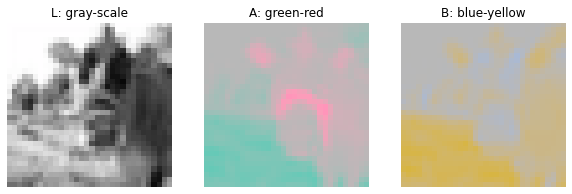

In [ ]:
#visualization 
(L_data, AB_data) = train_dataset[0]

print(L_data.size())

L_data = L_data.permute(1, 2, 0)
AB_data = AB_data.permute(1, 2, 0)

L_data = L_data.numpy()
AB_data = AB_data.numpy()

L_data  = L_data  * 128.0
AB_data = AB_data * 128.0

img = np.append(L_data, AB_data, 2)

LAB_image_visualization(img, figure_size=(10,10))

#Image Colorization Model

##U-Net 

REFS

*U-Net original paper* https://arxiv.org/pdf/1505.04597.pdf

*U-Net by PyTorch* https://github.com/harshitbansal05/Image-Colorization/blob/master/model.py

*U-Net for MRI segmentation* https://github.com/mateuszbuda/brain-segmentation-pytorch/blob/master/unet.py

*CNN PyTorch Tutorial* https://github.com/yunjey/pytorch-tutorial/blob/master/tutorials/02-intermediate/convolutional_neural_network/main.py#L35-L56

In [ ]:
class UNet(nn.Module):

    def unet_conv(self, in_dim, out_dim):
        return nn.Sequential(
            nn.Conv2d(in_dim, out_dim, 3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU(),#try LeakyReLU for encoding layers
            nn.Conv2d(out_dim, out_dim, 3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU() #try LeakyReLU for encoding layers
        )


    def up_conv(self, in_dim, out_dim):
        return nn.Sequential(
            nn.ConvTranspose2d(in_dim, out_dim, 2, 2)
        )


#just defining layers (conv, pooling, upsampling) as variables
    def __init__(self):
        super(UNet, self).__init__()

        #Encoding layers
        self.conv1 = self.unet_conv(1, 64) #input is 1 gray-scale channel 
        self.conv2 = self.unet_conv(64, 128)
        self.conv3 = self.unet_conv(128, 256)
        self.conv4 = self.unet_conv(256, 512)
        self.conv5 = self.unet_conv(512, 1024)

        #Decoding layers + Last layer 
        self.conv6 = self.unet_conv(1024, 512)
        self.conv7 = self.unet_conv(512, 256)
        self.conv8 = self.unet_conv(256, 128)
        self.conv9 = self.unet_conv(128, 64)
        self.conv10 = nn.Conv2d(64, 2, 1) #output is 2 color channels (A and B)

        #Max Pooling
        self.pool = nn.MaxPool2d(2)
        
        #Upsampling (Up convolution)
        self.up1 = self.up_conv(1024, 512)
        self.up2 = self.up_conv(512, 256)
        self.up3 = self.up_conv(256, 128)
        self.up4 = self.up_conv(128, 64)


#here you use your layers-variables from __init__ to construct network
    def forward(self, x):

        x1 = self.conv1(x) 
        x2 = self.conv2(self.pool(x1))
        x3 = self.conv3(self.pool(x2))
        x4 = self.conv4(self.pool(x3))
        x5 = self.conv5(self.pool(x4))
        
        x6 = self.conv6(torch.cat((x4, self.up1(x5)), 1))
        x7 = self.conv7(torch.cat((x3, self.up2(x6)), 1))
        x8 = self.conv8(torch.cat((x2, self.up3(x7)), 1))
        x9 = self.conv9(torch.cat((x1, self.up4(x8)), 1))
        x10 = self.conv10(x9) 
        activation = nn.Tanh()
        output = activation(x10)
        
        return output

In [ ]:
model = UNet()

In [ ]:
summary(model)

UNet(
  (conv1): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)), 640 params
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), 128 params
    (2): ReLU(), 0 params
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)), 36,928 params
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), 128 params
    (5): ReLU(), 0 params
  ), 37,824 params
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)), 73,856 params
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), 256 params
    (2): ReLU(), 0 params
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)), 147,584 params
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), 256 params
    (5): ReLU(), 0 params
  ), 221,952 params
  (conv3): Sequential(
    (0): Conv2d(

31042434

In [ ]:
#debugger
model = UNet()
for L, AB in train_loader:
    L = L.permute(0, 3, 1, 2)
    print("batch size:", L.shape)
    model.double()
    out = model(L)
    print(out.shape)
    break

batch size: torch.Size([100, 1, 32, 32])
torch.Size([100, 2, 32, 32])


##Slightly better U-Net

In [ ]:
class slightly_better_UNet(nn.Module):

    def unet_enc_conv(self, in_dim, out_dim):
        return nn.Sequential(
            nn.Conv2d(in_dim, out_dim, 3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.LeakyReLU(),
            nn.Conv2d(out_dim, out_dim, 3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.LeakyReLU() 
        )


    def unet_dec_conv(self, in_dim, out_dim):
        return nn.Sequential(
            nn.Conv2d(in_dim, out_dim, 3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU(),
            nn.Conv2d(out_dim, out_dim, 3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU()
        )


    def up_conv(self, in_dim, out_dim):
        return nn.Sequential(
            nn.ConvTranspose2d(in_dim, out_dim, 2, 2)
        )


#just defining layers (conv, pooling, upsampling) as variables
    def __init__(self):
        super(slightly_better_UNet, self).__init__()

        #Encoding layers
        self.conv1 = self.unet_enc_conv(1, 64) #input is 1 gray-scale channel 
        self.conv2 = self.unet_enc_conv(64, 128)
        self.conv3 = self.unet_enc_conv(128, 256)
        self.conv4 = self.unet_enc_conv(256, 512)
        self.conv5 = self.unet_enc_conv(512, 1024)

        #Decoding layers + Last layer 
        self.conv6 = self.unet_dec_conv(1024, 512)
        self.conv7 = self.unet_dec_conv(512, 256)
        self.conv8 = self.unet_dec_conv(256, 128)
        self.conv9 = self.unet_dec_conv(128, 64)
        self.conv10 = nn.Conv2d(64, 2, 1) #output is 2 color channels (A and B)

        #Max Pooling
        self.pool = nn.MaxPool2d(2)
        
        #Upsampling (Up convolution)
        self.up1 = self.up_conv(1024, 512)
        self.up2 = self.up_conv(512, 256)
        self.up3 = self.up_conv(256, 128)
        self.up4 = self.up_conv(128, 64)


#here you use your layers-variables from __init__ to construct network
    def forward(self, x):

        x1 = self.conv1(x) 
        x2 = self.conv2(self.pool(x1))
        x3 = self.conv3(self.pool(x2))
        x4 = self.conv4(self.pool(x3))
        x5 = self.conv5(self.pool(x4))
        
        x6 = self.conv6(torch.cat((x4, self.up1(x5)), 1))
        x7 = self.conv7(torch.cat((x3, self.up2(x6)), 1))
        x8 = self.conv8(torch.cat((x2, self.up3(x7)), 1))
        x9 = self.conv9(torch.cat((x1, self.up4(x8)), 1))
        x10 = self.conv10(x9) 
        activation = nn.Tanh()
        output = activation(x10)
        
        return output

In [ ]:
model = slightly_better_UNet()

In [ ]:
#debugger
model = slightly_better_UNet()
for L, AB in train_loader:
    L = L.permute(0, 3, 1, 2)
    print("batch size:", L.shape)
    model.double()
    out = model(L)
    print(out.shape)
    break

##Training + Validation

REFS

*How to iterate over two dataloaders simultaneously using pytorch?*  ***Answer #5*** https://www.mmbyte.com/article/48441.html

*Solutions from Pytorch Forum* https://discuss.pytorch.org/t/train-and-validate-simultaneously-on-two-datasets/19020/5

*Tells MSE is common choice for colorizing network*s https://towardsdatascience.com/image-colorization-using-convolutional-autoencoders-fdabc1cb1dbe

***Pokemon Images Colorization*** http://cs231n.stanford.edu/reports/2017/pdfs/302.pdf :

optimizer = Adam

num_epochs = 20 

batch_size = 64

learning_rate = 0.0002

###CIFAR-100

In [ ]:
num_epochs = 15 #20
batch_size = 100 #64 or 100
learning_rate = 0.0002 #0.0002

In [ ]:
num_epochs = 5
batch_size = 100
learning_rate = 0.00005

In [ ]:
num_epochs = 5 #interrupted at 4th epoch
batch_size = 100
learning_rate = 0.000005

In [ ]:
#Data Loaders
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size, shuffle=True)

In [ ]:
#Device configuration
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

#define model
model_1 = UNet()
model_1.double()
model_1 = model_1.to(device)

In [ ]:
#Loss
criterion = nn.MSELoss() #choose Loss 
#Optimizer
optimizer = torch.optim.Adam(model_1.parameters(), lr=learning_rate) 

In [ ]:
train_losses = []
val_losses = []

In [ ]:
#training & validation loop
for epoch in range(num_epochs):
    val_iter = iter(test_loader)

    for i, (L_train, AB_train) in enumerate(train_loader):
        model_1.train()
        
        L_train = L_train.to(device)
        AB_train = AB_train.to(device)
        
        #Forward pass
        outputs = model_1(L_train)
        loss = criterion(outputs, AB_train)
        
        #Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #Train loss
        train_data = loss.item()
        train_losses.append(train_data)
        train_mean_loss = (1 / len(train_losses)) * sum(train_losses)
        
        #Validation loss
        model_1.eval()

        try:
            L_val, AB_val = next(val_iter)
        except StopIteration: 
            val_iter = iter(test_loader)
            L_val, AB_val = next(val_iter)
            
        L_val = L_val.to(device)
        AB_val = AB_val.to(device)
            
        predictions = model_1(L_val)
        val_loss = criterion(predictions, AB_val)
            
        val_data = val_loss.item()
        val_losses.append(val_data)
        val_mean_loss = (1 / len(val_losses)) * sum(val_losses)
            
        if i % 100 == 0:
            print(
                'Epoch: {} [{}/{} ({:.0f}%)] \t Train Loss: {:.6f} \t Val Loss: {:.6f}'.
                format(epoch, i * len(L_train), len(train_loader.dataset),
                           100. * i / len(train_loader), train_mean_loss, val_mean_loss))

Epoch: 0 [0/50000 (0%)] 	 Train Loss: 0.201032 	 Val Loss: 0.025598
Epoch: 0 [10000/50000 (20%)] 	 Train Loss: 0.030926 	 Val Loss: 0.018863
Epoch: 0 [20000/50000 (40%)] 	 Train Loss: 0.023357 	 Val Loss: 0.017368
Epoch: 0 [30000/50000 (60%)] 	 Train Loss: 0.020607 	 Val Loss: 0.016704
Epoch: 0 [40000/50000 (80%)] 	 Train Loss: 0.019143 	 Val Loss: 0.016337
Epoch: 1 [0/50000 (0%)] 	 Train Loss: 0.018247 	 Val Loss: 0.016221
Epoch: 1 [10000/50000 (20%)] 	 Train Loss: 0.017595 	 Val Loss: 0.015971
Epoch: 1 [20000/50000 (40%)] 	 Train Loss: 0.017108 	 Val Loss: 0.015756
Epoch: 1 [30000/50000 (60%)] 	 Train Loss: 0.016756 	 Val Loss: 0.015579
Epoch: 1 [40000/50000 (80%)] 	 Train Loss: 0.016477 	 Val Loss: 0.015436
Epoch: 2 [0/50000 (0%)] 	 Train Loss: 0.016243 	 Val Loss: 0.015314
Epoch: 2 [10000/50000 (20%)] 	 Train Loss: 0.016032 	 Val Loss: 0.015214
Epoch: 2 [20000/50000 (40%)] 	 Train Loss: 0.015854 	 Val Loss: 0.015116
Epoch: 2 [30000/50000 (60%)] 	 Train Loss: 0.015700 	 Val Loss: 0.

In [ ]:
#training & validation loop
for epoch in range(num_epochs):
    val_iter = iter(test_loader)

    for i, (L_train, AB_train) in enumerate(train_loader):
        model_1.train()
        
        L_train = L_train.to(device)
        AB_train = AB_train.to(device)
        
        #Forward pass
        outputs = model_1(L_train)
        loss = criterion(outputs, AB_train)
        
        #Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #Train loss
        train_data = loss.item()
        train_losses.append(train_data)
        train_mean_loss = (1 / len(train_losses)) * sum(train_losses)
        
        #Validation loss
        model_1.eval()

        try:
            L_val, AB_val = next(val_iter)
        except StopIteration: 
            val_iter = iter(test_loader)
            L_val, AB_val = next(val_iter)
            
        L_val = L_val.to(device)
        AB_val = AB_val.to(device)
            
        predictions = model_1(L_val)
        val_loss = criterion(predictions, AB_val)
            
        val_data = val_loss.item()
        val_losses.append(val_data)
        val_mean_loss = (1 / len(val_losses)) * sum(val_losses)
            
        if i % 100 == 0:
            print(
                'Epoch: {} [{}/{} ({:.0f}%)] \t Train Loss: {:.6f} \t Val Loss: {:.6f}'.
                format(epoch, i * len(L_train), len(train_loader.dataset),
                           100. * i / len(train_loader), train_mean_loss, val_mean_loss))

Epoch: 0 [0/50000 (0%)] 	 Train Loss: 0.012428 	 Val Loss: 0.013430
Epoch: 0 [10000/50000 (20%)] 	 Train Loss: 0.012375 	 Val Loss: 0.013420
Epoch: 0 [20000/50000 (40%)] 	 Train Loss: 0.012321 	 Val Loss: 0.013410
Epoch: 0 [30000/50000 (60%)] 	 Train Loss: 0.012268 	 Val Loss: 0.013402
Epoch: 0 [40000/50000 (80%)] 	 Train Loss: 0.012214 	 Val Loss: 0.013392
Epoch: 1 [0/50000 (0%)] 	 Train Loss: 0.012162 	 Val Loss: 0.013382
Epoch: 1 [10000/50000 (20%)] 	 Train Loss: 0.012105 	 Val Loss: 0.013374
Epoch: 1 [20000/50000 (40%)] 	 Train Loss: 0.012052 	 Val Loss: 0.013367
Epoch: 1 [30000/50000 (60%)] 	 Train Loss: 0.012000 	 Val Loss: 0.013360
Epoch: 1 [40000/50000 (80%)] 	 Train Loss: 0.011948 	 Val Loss: 0.013352
Epoch: 2 [0/50000 (0%)] 	 Train Loss: 0.011899 	 Val Loss: 0.013346
Epoch: 2 [10000/50000 (20%)] 	 Train Loss: 0.011845 	 Val Loss: 0.013341
Epoch: 2 [20000/50000 (40%)] 	 Train Loss: 0.011793 	 Val Loss: 0.013336
Epoch: 2 [30000/50000 (60%)] 	 Train Loss: 0.011741 	 Val Loss: 0.

In [ ]:
#training & validation loop
for epoch in range(num_epochs):
    val_iter = iter(test_loader)

    for i, (L_train, AB_train) in enumerate(train_loader):
        model_1.train()
        
        L_train = L_train.to(device)
        AB_train = AB_train.to(device)
        
        #Forward pass
        outputs = model_1(L_train)
        loss = criterion(outputs, AB_train)
        
        #Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #Train loss
        train_data = loss.item()
        train_losses.append(train_data)
        train_mean_loss = (1 / len(train_losses)) * sum(train_losses)
        
        #Validation loss
        model_1.eval()

        try:
            L_val, AB_val = next(val_iter)
        except StopIteration: 
            val_iter = iter(test_loader)
            L_val, AB_val = next(val_iter)
            
        L_val = L_val.to(device)
        AB_val = AB_val.to(device)
            
        predictions = model_1(L_val)
        val_loss = criterion(predictions, AB_val)
            
        val_data = val_loss.item()
        val_losses.append(val_data)
        val_mean_loss = (1 / len(val_losses)) * sum(val_losses)
            
        if i % 100 == 0:
            print(
                'Epoch: {} [{}/{} ({:.0f}%)] \t Train Loss: {:.6f} \t Val Loss: {:.6f}'.
                format(epoch, i * len(L_train), len(train_loader.dataset),
                           100. * i / len(train_loader), train_mean_loss, val_mean_loss))

Epoch: 0 [0/50000 (0%)] 	 Train Loss: 0.011170 	 Val Loss: 0.013294
Epoch: 0 [10000/50000 (20%)] 	 Train Loss: 0.011123 	 Val Loss: 0.013292
Epoch: 0 [20000/50000 (40%)] 	 Train Loss: 0.011075 	 Val Loss: 0.013290
Epoch: 0 [30000/50000 (60%)] 	 Train Loss: 0.011029 	 Val Loss: 0.013289
Epoch: 0 [40000/50000 (80%)] 	 Train Loss: 0.010983 	 Val Loss: 0.013287
Epoch: 1 [0/50000 (0%)] 	 Train Loss: 0.010938 	 Val Loss: 0.013286
Epoch: 1 [10000/50000 (20%)] 	 Train Loss: 0.010893 	 Val Loss: 0.013285
Epoch: 1 [20000/50000 (40%)] 	 Train Loss: 0.010850 	 Val Loss: 0.013284
Epoch: 1 [30000/50000 (60%)] 	 Train Loss: 0.010807 	 Val Loss: 0.013283
Epoch: 1 [40000/50000 (80%)] 	 Train Loss: 0.010765 	 Val Loss: 0.013282
Epoch: 2 [0/50000 (0%)] 	 Train Loss: 0.010724 	 Val Loss: 0.013281
Epoch: 2 [10000/50000 (20%)] 	 Train Loss: 0.010683 	 Val Loss: 0.013280
Epoch: 2 [20000/50000 (40%)] 	 Train Loss: 0.010643 	 Val Loss: 0.013279
Epoch: 2 [30000/50000 (60%)] 	 Train Loss: 0.010604 	 Val Loss: 0.

KeyboardInterrupt: ignored

In [ ]:
#save losses
with open('/content/drive/My Drive/Project/dataset/train_losses_cifar100.pickle', 'wb') as f:
  pickle.dump(train_losses, f)

with open('/content/drive/My Drive/Project/dataset/val_losses_cifar100.pickle', 'wb') as f:
  pickle.dump(val_losses, f)

In [ ]:
#upload losses to Colab
with open('/content/drive/My Drive/Project/dataset/train_losses_cifar100.pickle', 'rb') as f:
  train_losses = pickle.load(f)

with open('/content/drive/My Drive/Project/dataset/val_losses_cifar100.pickle', 'rb') as f:
  val_losses = pickle.load(f)

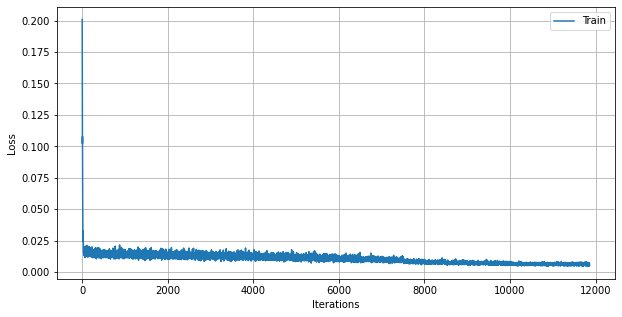

In [ ]:
plt.figure(figsize=(10, 5))

plt.plot(range(11859), train_losses, label="Train")
# plt.plot(range(11859), val_losses, label="Validation")

plt.grid(b=bool)
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend(loc='best')

plt.show()

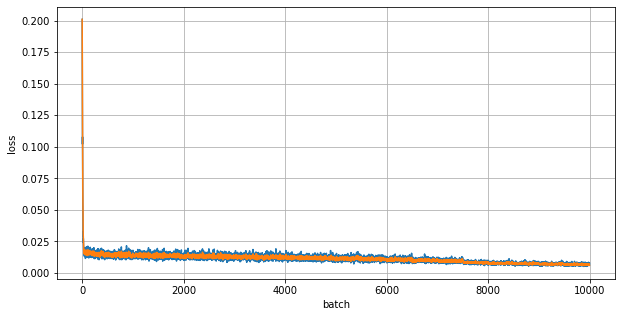

In [ ]:
 plt.figure(figsize=(10, 5))
 plt.grid(b=bool)
 
 plot_loss(train_losses, alpha=0.6)

###Dogs-vs-Cats #1

In [ ]:
num_epochs = 20 #20
batch_size = 64 #64 or 100
learning_rate = 0.0002 #0.0002

# checkpoint_UNET_Dogs-vs-Cats

In [ ]:
#Data Loaders
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size, shuffle=True)

In [ ]:
#Device configuration
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

#define model
model_2 = UNet()
model_2.double()
model_2 = model_2.to(device)

In [ ]:
#Loss
criterion = nn.MSELoss() #choose Loss 
#Optimizer
optimizer = torch.optim.Adam(model_2.parameters(), lr=learning_rate) 

In [ ]:
train_losses = []
val_losses = []

In [ ]:
#training & validation loop
for epoch in range(num_epochs):
    val_iter = iter(test_loader)

    for i, (L_train, AB_train) in enumerate(train_loader):
        model_2.train()
        
        L_train = L_train.to(device)
        AB_train = AB_train.to(device)
        
        #Forward pass
        outputs = model_2(L_train)
        loss = criterion(outputs, AB_train)
        
        #Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #Train loss
        train_data = loss.item()
        train_losses.append(train_data)
        train_mean_loss = (1 / len(train_losses)) * sum(train_losses)
        
        #Validation loss
        model_2.eval()

        try:
            L_val, AB_val = next(val_iter)
        except StopIteration: 
            val_iter = iter(test_loader)
            L_val, AB_val = next(val_iter)
            
        L_val = L_val.to(device)
        AB_val = AB_val.to(device)
            
        predictions = model_2(L_val)
        val_loss = criterion(predictions, AB_val)
            
        val_data = val_loss.item()
        val_losses.append(val_data)
        val_mean_loss = (1 / len(val_losses)) * sum(val_losses)
            
        if i % 100 == 0:
            print(
                'Epoch: {} [{}/{} ({:.0f}%)] \t Train Loss: {:.6f} \t Val Loss: {:.6f}'.
                format(epoch, i * len(L_train), len(train_loader.dataset),
                           100. * i / len(train_loader), train_mean_loss, val_mean_loss))

Epoch: 0 [0/24999 (0%)] 	 Train Loss: 0.115636 	 Val Loss: 0.015234
Epoch: 0 [6400/24999 (26%)] 	 Train Loss: 0.013550 	 Val Loss: 0.009389
Epoch: 0 [12800/24999 (51%)] 	 Train Loss: 0.010803 	 Val Loss: 0.008775
Epoch: 0 [19200/24999 (77%)] 	 Train Loss: 0.009798 	 Val Loss: 0.008538
Epoch: 1 [0/24999 (0%)] 	 Train Loss: 0.009327 	 Val Loss: 0.008387
Epoch: 1 [6400/24999 (26%)] 	 Train Loss: 0.008978 	 Val Loss: 0.008306
Epoch: 1 [12800/24999 (51%)] 	 Train Loss: 0.008735 	 Val Loss: 0.008219
Epoch: 1 [19200/24999 (77%)] 	 Train Loss: 0.008648 	 Val Loss: 0.008175
Epoch: 2 [0/24999 (0%)] 	 Train Loss: 0.008514 	 Val Loss: 0.008133
Epoch: 2 [6400/24999 (26%)] 	 Train Loss: 0.008398 	 Val Loss: 0.008080
Epoch: 2 [12800/24999 (51%)] 	 Train Loss: 0.008333 	 Val Loss: 0.008056
Epoch: 2 [19200/24999 (77%)] 	 Train Loss: 0.008259 	 Val Loss: 0.008024
Epoch: 3 [0/24999 (0%)] 	 Train Loss: 0.008211 	 Val Loss: 0.008005
Epoch: 3 [6400/24999 (26%)] 	 Train Loss: 0.008153 	 Val Loss: 0.007982
Ep

In [ ]:
#save losses
with open('/content/drive/My Drive/Project/dataset/train_losses_dogs-vs-cats.pickle', 'wb') as f:
  pickle.dump(train_losses, f)

with open('/content/drive/My Drive/Project/dataset/val_losses_dogs-vs-cats.pickle', 'wb') as f:
  pickle.dump(val_losses, f)

In [ ]:
#upload losses to Colab
with open('/content/drive/My Drive/Project/dataset/train_losses_dogs-vs-cats.pickle', 'rb') as f:
  train_losses = pickle.load(f)

with open('/content/drive/My Drive/Project/dataset/val_losses_dogs-vs-cats.pickle', 'rb') as f:
  val_losses = pickle.load(f)

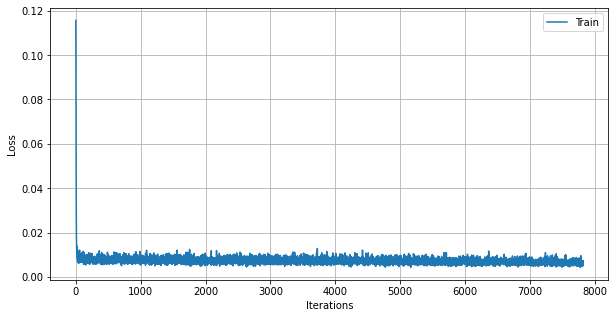

In [ ]:
plt.figure(figsize=(10, 5))

plt.plot(range(7820), train_losses, label="Train")
# plt.plot(range(7820), val_losses, label="Validation")

plt.grid(b=bool)
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend(loc='best')

plt.show()

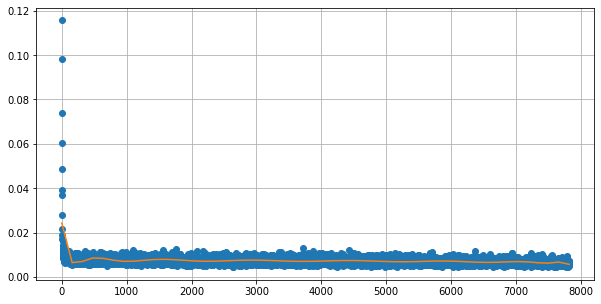

In [ ]:
plt.figure(figsize=(10, 5))
y = train_losses
x = range(7820)

# calculate polynomial
z = np.polyfit(x, y, 15)
f = np.poly1d(z)

# calculate new x's and y's
x_new = np.linspace(x[0], x[-1], 50)
y_new = f(x_new)

plt.grid(b=bool)
plt.plot(x,y,'o', x_new, y_new)
plt.show()

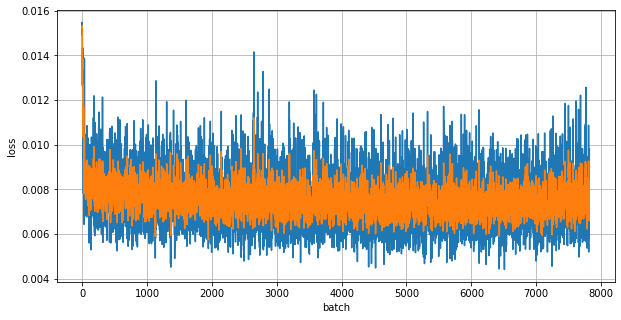

In [ ]:
 plt.figure(figsize=(10, 5))
 plt.grid(b=bool)
 
 plot_loss(val_losses, alpha=0.6)

###Dogs-vs-Cats #2

In [ ]:
num_epochs = 20 #20
batch_size = 64 #64 or 100
learning_rate = 0.0002 #0.0002

#checkpoint_UNET_Dogs-vs-Cats_2 DONE

In [ ]:
num_epochs = 4 
batch_size = 64 
learning_rate = 0.00005 

#checkpoint_UNET_Dogs-vs-Cats_2_1 DONE

In [ ]:
#Data Loaders
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size, shuffle=True)

In [ ]:
#Device configuration
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

#define model
model_3 = slightly_better_UNet()
model_3.double()
model_3 = model_3.to(device)

In [ ]:
#Loss
criterion = nn.MSELoss() #choose Loss 
#Optimizer
optimizer = torch.optim.Adam(model_3.parameters(), lr=learning_rate) 

In [ ]:
train_losses = []
val_losses = []

In [ ]:
#training & validation loop
for epoch in range(num_epochs):
    val_iter = iter(test_loader)

    for i, (L_train, AB_train) in enumerate(train_loader):
        model_3.train()
        
        L_train = L_train.to(device)
        AB_train = AB_train.to(device)
        
        #Forward pass
        outputs = model_3(L_train)
        loss = criterion(outputs, AB_train)
        
        #Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #Train loss
        train_data = loss.item()
        train_losses.append(train_data)
        train_mean_loss = (1 / len(train_losses)) * sum(train_losses)
        
        #Validation loss
        model_3.eval()

        try:
            L_val, AB_val = next(val_iter)
        except StopIteration: 
            val_iter = iter(test_loader)
            L_val, AB_val = next(val_iter)
            
        L_val = L_val.to(device)
        AB_val = AB_val.to(device)
            
        predictions = model_3(L_val)
        val_loss = criterion(predictions, AB_val)
            
        val_data = val_loss.item()
        val_losses.append(val_data)
        val_mean_loss = (1 / len(val_losses)) * sum(val_losses)
            
        if i % 100 == 0:
            print(
                'Epoch: {} [{}/{} ({:.0f}%)] \t Train Loss: {:.6f} \t Val Loss: {:.6f}'.
                format(epoch, i * len(L_train), len(train_loader.dataset),
                           100. * i / len(train_loader), train_mean_loss, val_mean_loss))

Epoch: 0 [0/24999 (0%)] 	 Train Loss: 0.116120 	 Val Loss: 0.011781
Epoch: 0 [6400/24999 (26%)] 	 Train Loss: 0.014104 	 Val Loss: 0.008784
Epoch: 0 [12800/24999 (51%)] 	 Train Loss: 0.011085 	 Val Loss: 0.008605
Epoch: 0 [19200/24999 (77%)] 	 Train Loss: 0.010057 	 Val Loss: 0.008406
Epoch: 1 [0/24999 (0%)] 	 Train Loss: 0.009546 	 Val Loss: 0.008347
Epoch: 1 [6400/24999 (26%)] 	 Train Loss: 0.009186 	 Val Loss: 0.008284
Epoch: 1 [12800/24999 (51%)] 	 Train Loss: 0.008939 	 Val Loss: 0.008321
Epoch: 1 [19200/24999 (77%)] 	 Train Loss: 0.008753 	 Val Loss: 0.008262
Epoch: 2 [0/24999 (0%)] 	 Train Loss: 0.008626 	 Val Loss: 0.008234
Epoch: 2 [6400/24999 (26%)] 	 Train Loss: 0.008529 	 Val Loss: 0.008224
Epoch: 2 [12800/24999 (51%)] 	 Train Loss: 0.008435 	 Val Loss: 0.008175
Epoch: 2 [19200/24999 (77%)] 	 Train Loss: 0.008344 	 Val Loss: 0.008148
Epoch: 3 [0/24999 (0%)] 	 Train Loss: 0.008291 	 Val Loss: 0.008121
Epoch: 3 [6400/24999 (26%)] 	 Train Loss: 0.008252 	 Val Loss: 0.008088
Ep

In [ ]:
#training & validation loop
for epoch in range(num_epochs):
    val_iter = iter(test_loader)

    for i, (L_train, AB_train) in enumerate(train_loader):
        model_3.train()
        
        L_train = L_train.to(device)
        AB_train = AB_train.to(device)
        
        #Forward pass
        outputs = model_3(L_train)
        loss = criterion(outputs, AB_train)
        
        #Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #Train loss
        train_data = loss.item()
        train_losses.append(train_data)
        train_mean_loss = (1 / len(train_losses)) * sum(train_losses)
        
        #Validation loss
        model_3.eval()

        try:
            L_val, AB_val = next(val_iter)
        except StopIteration: 
            val_iter = iter(test_loader)
            L_val, AB_val = next(val_iter)
            
        L_val = L_val.to(device)
        AB_val = AB_val.to(device)
            
        predictions = model_3(L_val)
        val_loss = criterion(predictions, AB_val)
            
        val_data = val_loss.item()
        val_losses.append(val_data)
        val_mean_loss = (1 / len(val_losses)) * sum(val_losses)
            
        if i % 100 == 0:
            print(
                'Epoch: {} [{}/{} ({:.0f}%)] \t Train Loss: {:.6f} \t Val Loss: {:.6f}'.
                format(epoch, i * len(L_train), len(train_loader.dataset),
                           100. * i / len(train_loader), train_mean_loss, val_mean_loss))

Epoch: 0 [0/24999 (0%)] 	 Train Loss: 0.007332 	 Val Loss: 0.007551
Epoch: 0 [6400/24999 (26%)] 	 Train Loss: 0.007321 	 Val Loss: 0.007549
Epoch: 0 [12800/24999 (51%)] 	 Train Loss: 0.007307 	 Val Loss: 0.007545
Epoch: 0 [19200/24999 (77%)] 	 Train Loss: 0.007294 	 Val Loss: 0.007544
Epoch: 1 [0/24999 (0%)] 	 Train Loss: 0.007282 	 Val Loss: 0.007540
Epoch: 1 [6400/24999 (26%)] 	 Train Loss: 0.007268 	 Val Loss: 0.007537
Epoch: 1 [12800/24999 (51%)] 	 Train Loss: 0.007253 	 Val Loss: 0.007536
Epoch: 1 [19200/24999 (77%)] 	 Train Loss: 0.007240 	 Val Loss: 0.007534
Epoch: 2 [0/24999 (0%)] 	 Train Loss: 0.007230 	 Val Loss: 0.007531
Epoch: 2 [6400/24999 (26%)] 	 Train Loss: 0.007216 	 Val Loss: 0.007529
Epoch: 2 [12800/24999 (51%)] 	 Train Loss: 0.007200 	 Val Loss: 0.007530
Epoch: 2 [19200/24999 (77%)] 	 Train Loss: 0.007188 	 Val Loss: 0.007527
Epoch: 3 [0/24999 (0%)] 	 Train Loss: 0.007176 	 Val Loss: 0.007526
Epoch: 3 [6400/24999 (26%)] 	 Train Loss: 0.007162 	 Val Loss: 0.007525
Ep

In [ ]:
#save losses
with open('/content/drive/My Drive/Project/dataset/train_losses_dogs-vs-cats_2.pickle', 'wb') as f:
  pickle.dump(train_losses, f)

with open('/content/drive/My Drive/Project/dataset/val_losses_dogs-vs-cats_2.pickle', 'wb') as f:
  pickle.dump(val_losses, f)

In [ ]:
#upload losses to Colab
with open('/content/drive/My Drive/Project/dataset/train_losses_dogs-vs-cats_2.pickle', 'rb') as f:
  train_losses = pickle.load(f)

with open('/content/drive/My Drive/Project/dataset/val_losses_dogs-vs-cats_2.pickle', 'rb') as f:
  val_losses = pickle.load(f)

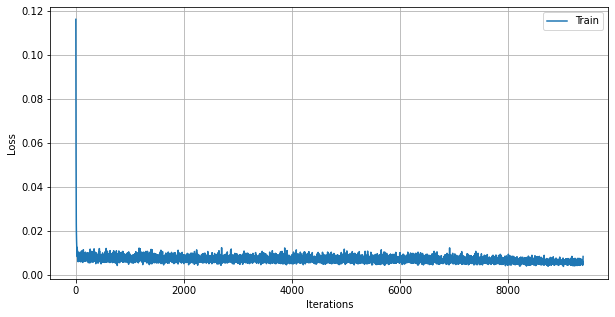

In [ ]:
plt.figure(figsize=(10, 5))

plt.plot(range(9384), train_losses, label="Train")
# plt.plot(range(9384), val_losses, label="Validation")

plt.grid(b=bool)
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend(loc='best')

plt.show()

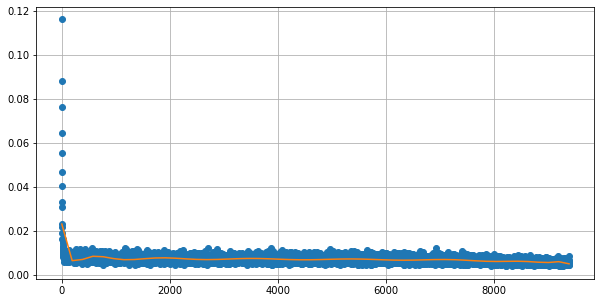

In [ ]:
plt.figure(figsize=(10, 5))
y = train_losses
x = range(9384)

z = np.polyfit(x, y, 15)
f = np.poly1d(z)

x_new = np.linspace(x[0], x[-1], 50)
y_new = f(x_new)

plt.grid(b=bool)
plt.plot(x,y,'o', x_new, y_new)
plt.show()

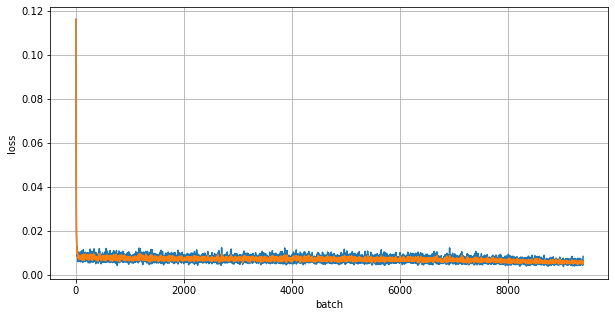

In [ ]:
 plt.figure(figsize=(10, 5))
 plt.grid(b=bool)
 
 plot_loss(train_losses, alpha=0.6)

##Predictions

###Single image

In [ ]:
model_1.eval()

(L_data, AB_data) = test_loader.dataset[:64]
L_data = L_data.to(device)
AB_data = AB_data.to(device) 

y_pred = model_1(L_data)

In [ ]:
ground_truth_index = 5

In [ ]:
y_pred_single = y_pred[ground_truth_index]
y_pred_single = y_pred_single.cpu()

print(y_pred_single.size())

x_input_single = L_data[ground_truth_index]
x_input_single = x_input_single.cpu()

print(x_input_single.size())

torch.Size([2, 32, 32])
torch.Size([1, 32, 32])


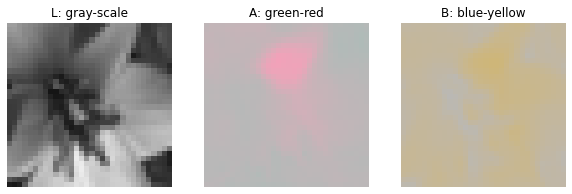

In [ ]:
#visualization 

x_input_single = x_input_single.permute(1, 2, 0)
y_pred_single = y_pred_single.permute(1, 2, 0)

x_input_single = x_input_single.detach().numpy()
y_pred_single = y_pred_single.detach().numpy()

x_input_single  = x_input_single  * 128.0
y_pred_single = y_pred_single * 128.0

img = np.append(x_input_single, y_pred_single, 2)

LAB_image_visualization(img, figure_size=(10,10))

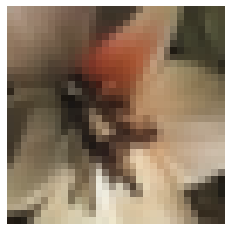

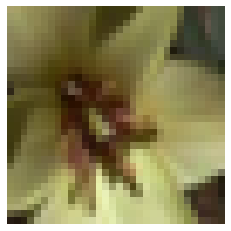

In [ ]:
img_back_rgb = lab2rgb(img)

plt.axis("off")
plt.imshow(img_back_rgb)

plt.show()

img_ground_truth = x_test[ground_truth_index]

plt.axis("off")
plt.imshow(img_ground_truth)

plt.show()


###Multiply images CIFAR-100 #1

In [ ]:
model_1.eval()

(L_data, AB_data) = test_loader.dataset[:30]
L_data = L_data.to(device)
AB_data = AB_data.to(device) 

y_pred = model_1(L_data)

In [ ]:
y_pred = y_pred.cpu()

print(y_pred.size())

x_input = L_data[:30]
x_input = x_input.cpu()

print(x_input.size())

torch.Size([30, 2, 32, 32])
torch.Size([30, 1, 32, 32])


In [ ]:
#visualization 

x_input = x_input.permute(0, 2, 3, 1)
y_pred = y_pred.permute(0, 2, 3, 1)

x_input = x_input.detach().numpy()
y_pred = y_pred.detach().numpy()

x_input  = x_input  * 128.0
y_pred = y_pred * 128.0

predicted_dataset = np.append(x_input, y_pred, 3)

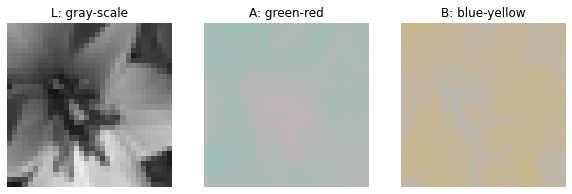

In [ ]:
LAB_image_visualization(predicted_dataset[5], figure_size=(10,10))

In [ ]:
predicted_dataset_back_rgb = np.zeros(predicted_dataset.shape)

for i in range(predicted_dataset.shape[0]):
    predicted_dataset_back_rgb[i] = lab2rgb(predicted_dataset[i])

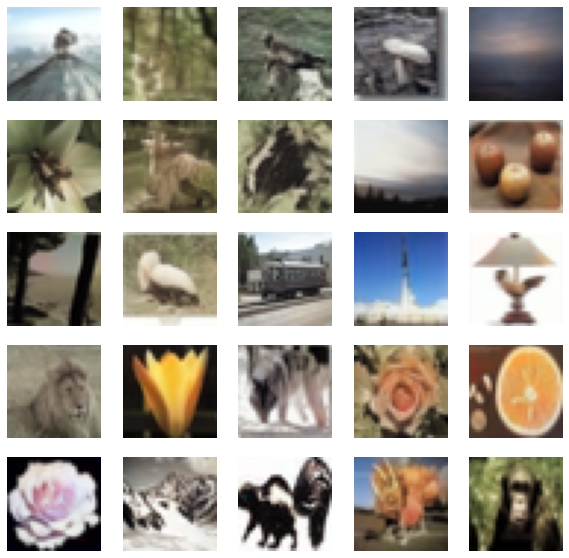

In [ ]:
dataset_visualization(predicted_dataset_back_rgb[:30], 5, 5, (10, 10))

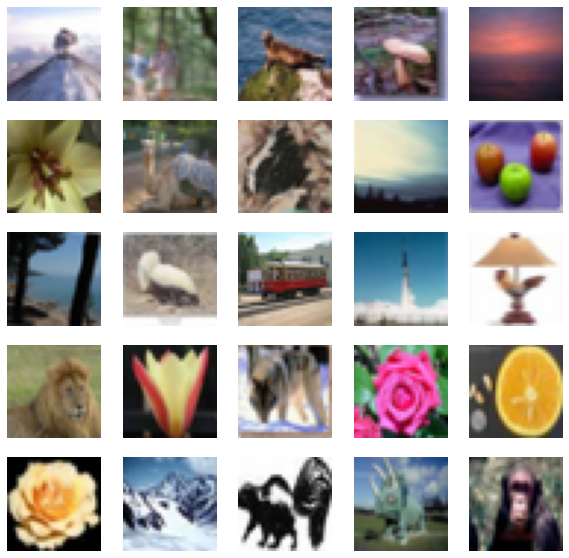

In [ ]:
dataset_visualization(x_test[:30], 5, 5, (10, 10))

###Multiply images Dogs-vs-Cats #1


In [ ]:
model_2.eval()

(L_data, AB_data) = test_loader.dataset[:64]
L_data = L_data.to(device)
AB_data = AB_data.to(device) 

y_pred = model_2(L_data)

In [ ]:
y_pred = y_pred.cpu()

print(y_pred.size())

x_input = L_data[:64]
x_input = x_input.cpu()

print(x_input.size())

torch.Size([64, 2, 80, 80])
torch.Size([64, 1, 80, 80])


In [ ]:
#visualization 

x_input = x_input.permute(0, 2, 3, 1)
y_pred = y_pred.permute(0, 2, 3, 1)

x_input = x_input.detach().numpy()
y_pred = y_pred.detach().numpy()

x_input  = x_input  * 128.0
y_pred = y_pred * 128.0

predicted_dataset = np.append(x_input, y_pred, 3)

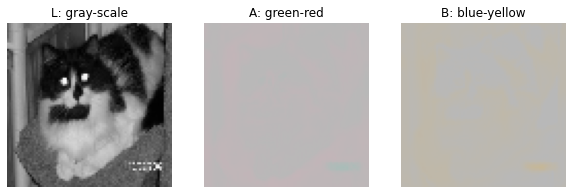

In [ ]:
LAB_image_visualization(predicted_dataset[5], figure_size=(10,10))

In [ ]:
predicted_dataset_back_rgb = np.zeros(predicted_dataset.shape)

for i in range(predicted_dataset.shape[0]):
    predicted_dataset_back_rgb[i] = lab2rgb(predicted_dataset[i])

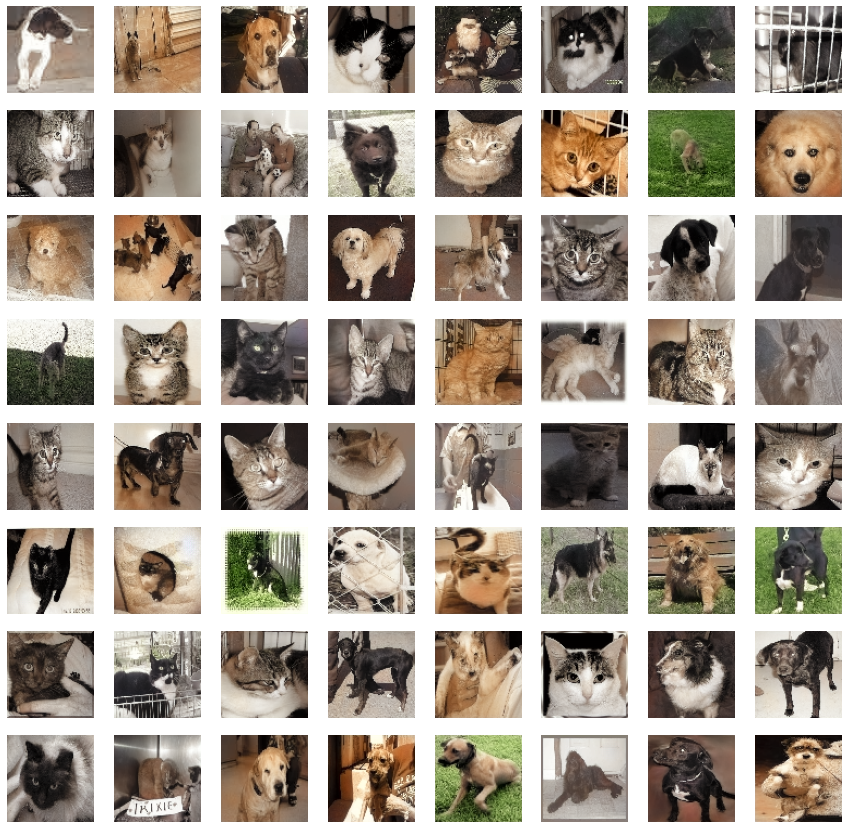

In [ ]:
dataset_visualization(predicted_dataset_back_rgb[:64], 8, 8, (15, 15))

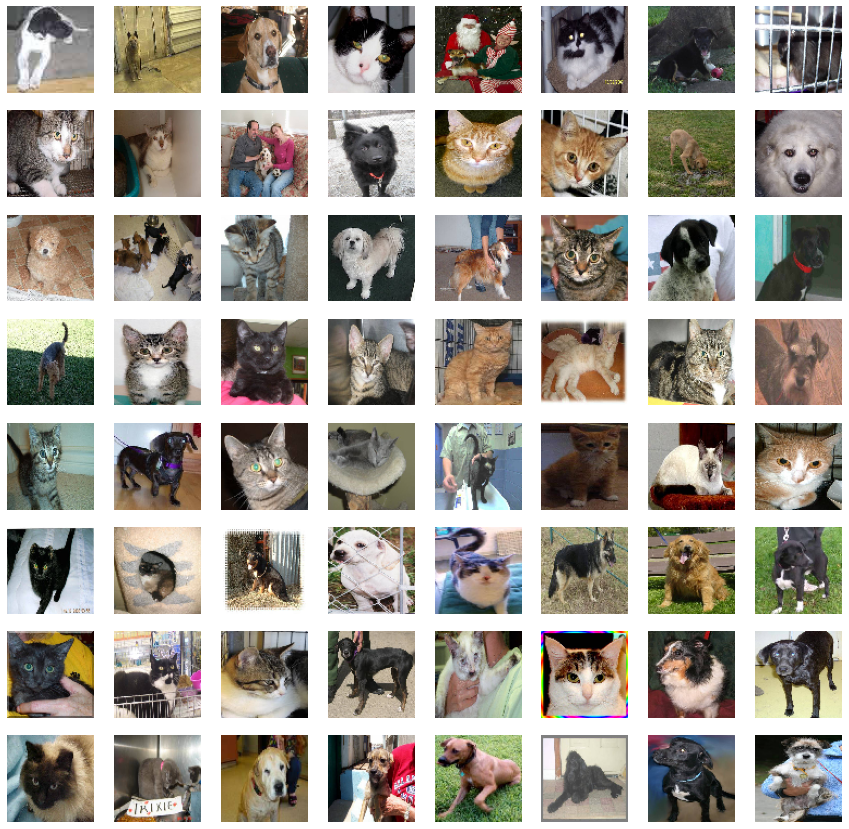

In [ ]:
dataset_visualization(x_test[:64], 8, 8, (15, 15))

###Multiply images Dogs-vs-Cats #2


In [ ]:
model_3.eval()

(L_data, AB_data) = test_loader.dataset[:64]
L_data = L_data.to(device)
AB_data = AB_data.to(device) 

y_pred = model_3(L_data)

In [ ]:
y_pred = y_pred.cpu()

print(y_pred.size())

x_input = L_data[:64]
x_input = x_input.cpu()

print(x_input.size())

torch.Size([64, 2, 80, 80])
torch.Size([64, 1, 80, 80])


In [ ]:
#visualization 

x_input = x_input.permute(0, 2, 3, 1)
y_pred = y_pred.permute(0, 2, 3, 1)

x_input = x_input.detach().numpy()
y_pred = y_pred.detach().numpy()

x_input  = x_input  * 128.0
y_pred = y_pred * 128.0

predicted_dataset = np.append(x_input, y_pred, 3)

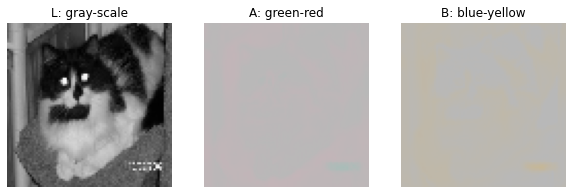

In [ ]:
LAB_image_visualization(predicted_dataset[5], figure_size=(10,10))

In [ ]:
predicted_dataset_back_rgb = np.zeros(predicted_dataset.shape)

for i in range(predicted_dataset.shape[0]):
    predicted_dataset_back_rgb[i] = lab2rgb(predicted_dataset[i])

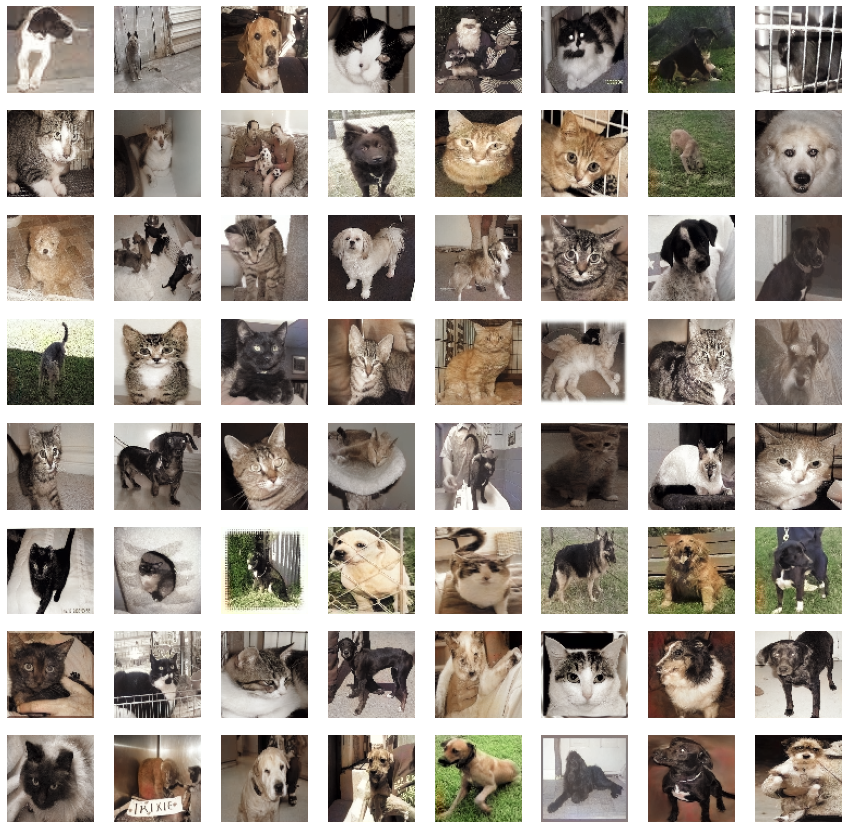

In [ ]:
dataset_visualization(predicted_dataset_back_rgb[:64], 8, 8, (15, 15))

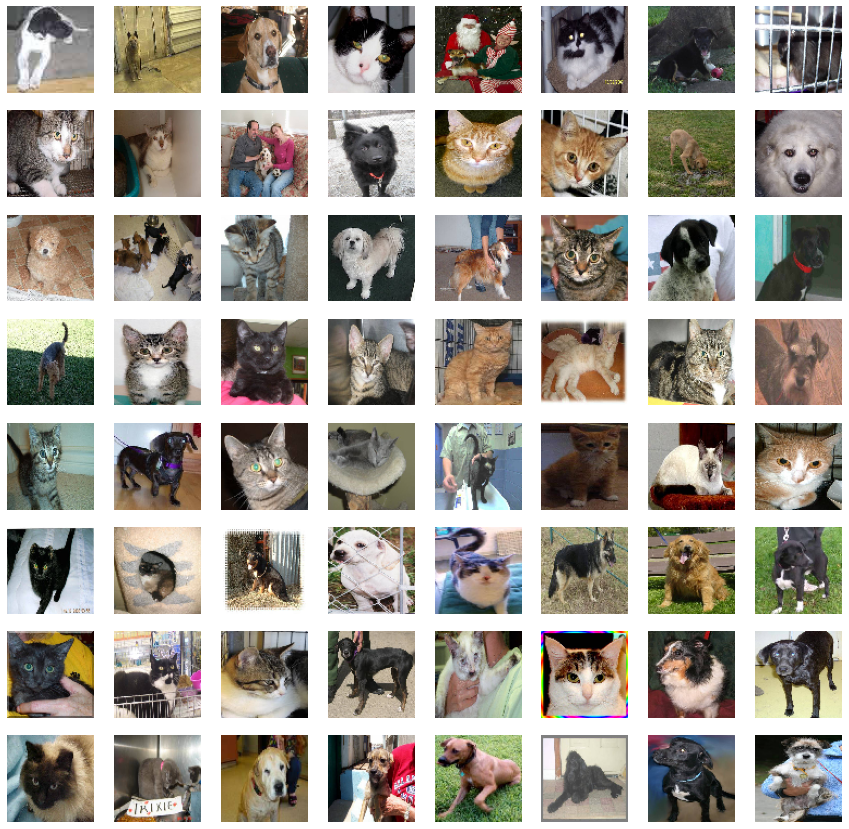

In [ ]:
dataset_visualization(x_test[:64], 8, 8, (15, 15))

##Save & Downloading the model

In [ ]:
torch.save(model_1.state_dict(), 'checkpoint_UNET_cifar100.pth')

# download checkpoint file
files.download('checkpoint_UNET_cifar100.pth')

#2 test images

In [ ]:
dir = '/content/drive/My Drive/Project/test_images'

In [ ]:
test_images = []

In [ ]:
for img in pathlib.Path(dir).iterdir():
    current_img = load_img(img, color_mode='rgb', target_size=(160, 160))
    array_img = img_to_array(current_img, dtype=np.uint8)
    test_images.append(array_img)
    print(f'{img} done')

/content/drive/My Drive/Project/test_images/pathetic_2.jpg done
/content/drive/My Drive/Project/test_images/pathetic_1.jpg done


In [ ]:
test_images = np.asarray(test_images)

In [ ]:
np.shape(test_images)

(2, 160, 160, 3)

##RGB to LAB space

In [ ]:
# normalization of RGB
test_images = test_images / 255.0

In [ ]:
# RGB to LAB
test_images_lab = rgb2lab(test_images)

In [ ]:
np.shape(test_images_lab)

(2, 150, 150, 3)

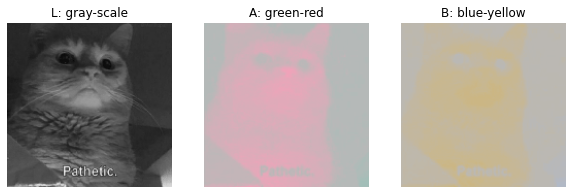

In [ ]:
LAB_image_visualization(test_images_lab[1], figure_size=(10,10))

##Preparing ***test_images_lab x&y***

In [ ]:
# normalization of LAB from (-128, 128) to (-1, 1)
test_images_lab = test_images_lab / 128.0

In [ ]:
y_img_lab = test_images_lab[:, :, :, 1:]

x_img_lab = test_images_lab[:, :, :, :1]

In [ ]:
x_img_lab = torch.from_numpy(x_img_lab)
y_img_lab = torch.from_numpy(y_img_lab)

x_img_lab = x_img_lab.permute(0, 3, 1, 2)
y_img_lab = y_img_lab.permute(0, 3, 1, 2)

In [ ]:
np.shape(y_img_lab)

torch.Size([2, 2, 160, 160])

##Prediction

In [ ]:
model_3.eval()

L_data = x_img_lab
AB_data = y_img_lab

L_data = L_data.to(device)
AB_data = AB_data.to(device) 

y_pred = model_3(L_data)

In [ ]:
y_pred = y_pred.cpu()

print(y_pred.size())

x_input = L_data
x_input = x_input.cpu()

print(x_input.size())

torch.Size([2, 2, 160, 160])
torch.Size([2, 1, 160, 160])


In [ ]:
#visualization 

x_input = x_input.permute(0, 2, 3, 1)
y_pred = y_pred.permute(0, 2, 3, 1)

x_input = x_input.detach().numpy()
y_pred = y_pred.detach().numpy()

x_input  = x_input  * 128.0
y_pred = y_pred * 128.0

predicted_dataset = np.append(x_input, y_pred, 3)

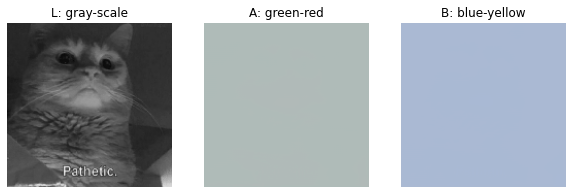

In [ ]:
LAB_image_visualization(predicted_dataset[1], figure_size=(10,10))

In [ ]:
predicted_dataset_back_rgb = np.zeros(predicted_dataset.shape)

for i in range(predicted_dataset.shape[0]):
    predicted_dataset_back_rgb[i] = lab2rgb(predicted_dataset[i])

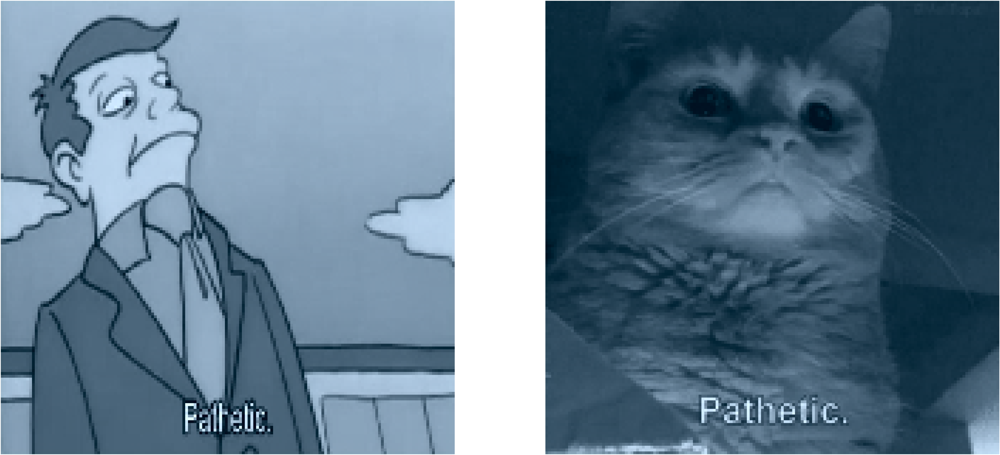

In [ ]:
dataset_visualization(predicted_dataset_back_rgb, 1, 2, (160, 160))